Osnabrück University - Computer Vision (Winter Term 2020/21) - Prof. Dr.-Ing. G. Heidemann, Ulf Krumnack, Axel Schaffland

# Exercise Sheet 03: Morphological Operations¶

## Introduction

This week's sheet should be solved and handed in before the end of **Saturday, November 21, 2020**. If you need help (and Google and other resources were not enough), feel free to contact your groups' designated tutor or whomever of us you run into first. Please upload your results to your group's Stud.IP folder.

## Assignment 0: Math recap (complex numbers) [0 Points]

This exercise is supposed to be very easy, does not give any points, and is voluntary. There will be a similar exercise on every sheet. It is intended to revise some basic mathematical notions that are assumed throughout this class and to allow you to check if you are comfortable with them. Usually you should have no problem to answer these questions offhand, but if you feel unsure, this is a good time to look them up again. You are always welcome to discuss questions with the tutors or in the practice session. Also, if you have a (math) topic you would like to recap, please let us know.

**a)** What is a *complex number*, what is the *complex plane*, how are complex numbers usually denoted?

**b)** What is the *real* and the *imaginary* part of a complex number? What is the *absolute value* of a complex number? What is the *complex conjugate*?

YOUR ANSWER HERE

**c)** What are polar coordinates? What are their advantages? Can you convert between cartesian and polar coordinates? Can you write down $i=\sqrt{-1}$ in polar coordinates? What about $\sqrt{i}$?

YOUR ANSWER HERE

**d)** Python, and also numpy, support calculations with complex numbers. Consult the documentation to find out details. Notice that $i$ is substituted by $j$ in Python.

In [ ]:
# YOUR CODE HERE

## Assignment 1: Properties of morphological operators [5 Points]

This exercise will elaborate on the basic morphological operators of *erosion* and *dilation* (cf. CV-05 slides 4-14).

### a) Duality

Proof that *erosion* and *dilation* are *dual* operators, i.e.

$$ g^{\ast}\oplus S = (g\ominus S)^{\ast}\qquad\text{and}\qquad
g^{\ast}\ominus S = (g\oplus S)^{\ast}$$

here $g^{\ast}$ denotes the inverted binary image, i.e. $g^{\ast}(x,y) = 1 - g(x,y) = \neg g(x,y)$, i.e. 1-pixel become 0 and 0-pixel become 1.

To lazy to write everything down ^^ 

### b) Superposition

As *erosion* and *dilation* have been introduced for binary images, the notion of *linearity* is not really appropriate here. However, some weaker version, called *superposition* can be defined: instead of forming linear combination, one takes the logical disjunction:

$$(g_1\lor g_2)(x,y) := g_1(x,y)\lor g_2(x,y)$$

Check for both operations if *erosion* and *dilation* are "compatible" with superposition, i.e. if first *eroding* (or *dilating*) two images and superposing the result is the same as first superposing the images and then *eroding* (or *dilating*) the result.

This does not hold for erosion, as you may have superpositioning of objects in the picture $(g_1\lor g_2)(x,y)$. As both borders are combining you will see a different shape as if you erode each picture separately.

In [1]:
# YOUR CODE HERE

### c) Chaining

Show that *dilation* and *erosion* have the following properties: given two structering elements $S_1$ and $S_2$, it holds

\begin{align}
  (g\oplus S_1)\oplus S_2 & & = & g\oplus (S_1\oplus S_2) && = (g\oplus S_2)\oplus S_1 \\
  (g\ominus S_1)\ominus S_2 & & = & g\ominus (S_1\ominus S_2) && = (g\ominus S_2)\ominus S_1 \\  
\end{align}

What are the practical consequences?

no idea how to show this in mathematical manner here.

If the above properties are admissible, you can errode/dialate one structuring element with by an other and aplicate the resulting structuring element on the original picture to safe computation time. Further the order of application does not matter.

## Assignment 2: Application [5 Points]


### a) Boundary extraction

Extract the boundary of a shape using opening or closing. You may use `binary_dilation` or `binary_erosion` from `scipy.ndimage.morphology`. Can you achieve a thicker boundary?

<Figure size 432x288 with 0 Axes>

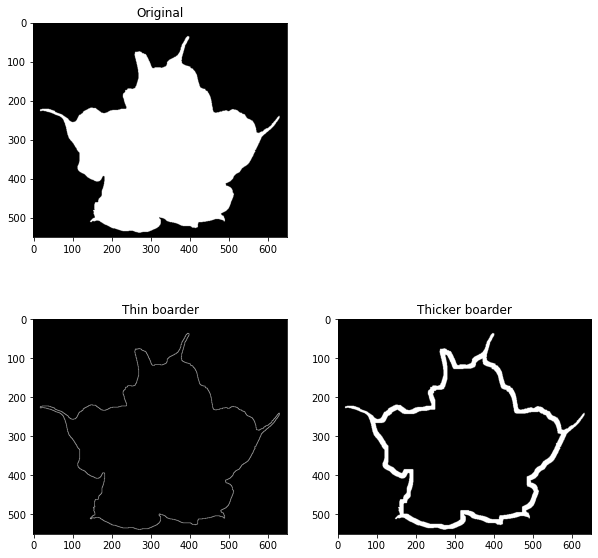

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['image.cmap'] = 'gray'
import scipy.ndimage.morphology as morph
from imageio import imread

def my_boundary(img,times):
    """
    Compute boundary of binary image.

    Parameters
    ----------
    img : ndarray of bools
        A binary image.
        
    Returns
    -------
    boundary : ndarray of bools
        The boundary as a binary image.
    """
    
    boundary = np.zeros(img.shape,np.bool)
    
    #Defining structuring element for erosion
    structure=np.array([[1,1,1],[1,1,1],[1,1,1]])
    
    #convert bool to int    
    img_int = np.multiply(img, 1)
    
    #use erotion x-times with the structuring element
    boundary_bef_op=morph.binary_erosion(img_int,structure,times)
    
    #convert bool to int  
    boundary_int = np.multiply(boundary_bef_op, 1)
    
    #subtract eroded image from original image
    boundary=np.subtract(img_int,boundary_int)
    
    return boundary
    
img = imread("images/engelstrompete.png") > 0
plt.gray()
plt.figure(figsize=(10,10))
plt.subplot(2,2,1)
plt.title("Original")
plt.imshow(img)
plt.subplot(2,2,3)
plt.title("Thin boarder")
plt.imshow(my_boundary(img,1))
plt.subplot(2,2,4)
plt.title("Thicker boarder")
plt.imshow(my_boundary(img,10))
plt.show()

### b)  Distance transform

Implement distance transform according to the ideas of (CV-05 slides 34ff).  Discuss the effect of different structuring elements.

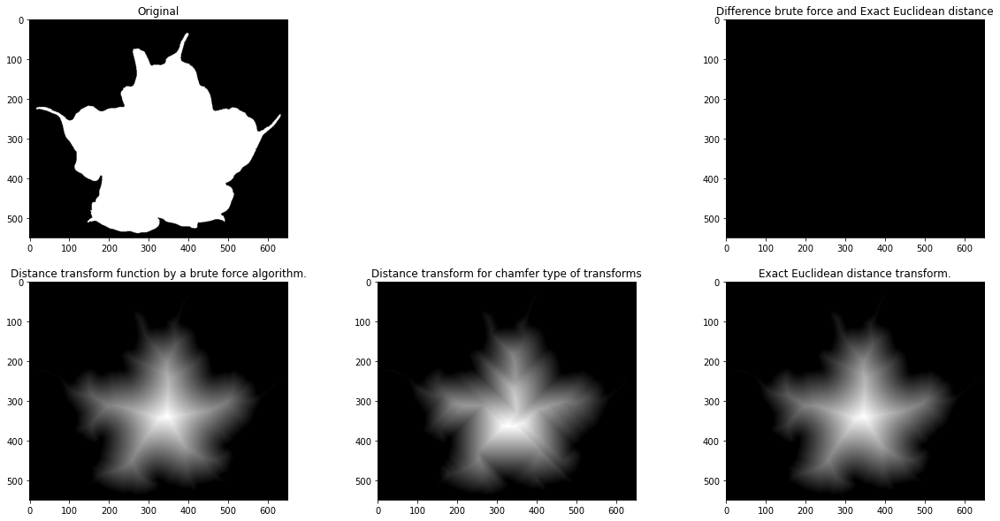

In [2]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import morphology as morph, generate_binary_structure
from imageio import imread

def my_distance_transform(img):
    """Distance transform of binary image.

    Args:
    img (ndarray of bools): A binary image.
        
    Returns:
    dt (ndarray of ints): The distance transform of the input image.
    """
    
    dt = np.zeros(img.shape,np.int32)
    
    dt=morph.distance_transform_bf(img)
    
    return dt


img = imread("images/engelstrompete.png") > 0
plt.figure(figsize=(20,10))
plt.subplot(2,3,1)
plt.title("Original")
plt.imshow(img)
plt.subplot(2,3,3)
plt.title("Difference brute force and Exact Euclidean distance")
plt.imshow(morph.distance_transform_edt(img)-my_distance_transform(img))
plt.subplot(2,3,4)
plt.title("Distance transform function by a brute force algorithm.")
plt.imshow(my_distance_transform(img))
plt.subplot(2,3,5)
plt.title("Distance transform for chamfer type of transforms")
plt.imshow(morph.distance_transform_cdt(img))
plt.subplot(2,3,6)
plt.title("Exact Euclidean distance transform.")
plt.imshow(morph.distance_transform_edt(img))
plt.show()

YOUR ANSWER HERE

### c) Morphing

Write a function `my_morph` that implements morphing according to (CV-05 slide 41). You may use your function `my_distance_transform` from part b), or the function `distance_transform_edt` from `scipy.ndimage.morphology`.

<Figure size 432x288 with 0 Axes>

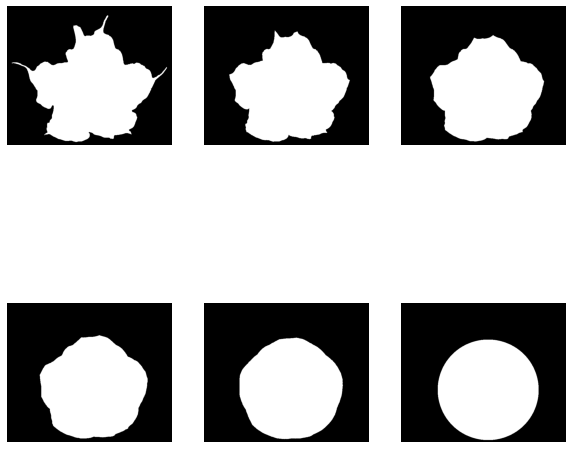

In [10]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import scipy.ndimage.morphology as morph
from imageio import imread


def my_morph(A,B,ratio):
    """Morphing from binary image A to image B.

    Args:
        A (ndarray of bools): A binary image (start).
        B (ndarray of bools): A binary image (target), same shape as A.
        ratio (float from 0.0 to 1.0): The ratio of image A and image B.
            0.0=only image A, 1.0=only image B.
        
    Returns:
        morph (ndarray of bools): A binary intermediate image between A and B.
        
    """

     #convert bool to int    
    #img_A_int = np.multiply(A, 1)
    #img_B_int = np.multiply(B, 1)
    
    result = np.zeros(A.shape,np.bool)
    
    Dist_A=morph.distance_transform_edt(A)- morph.distance_transform_edt(~A)
    Dist_B=morph.distance_transform_edt(B)- morph.distance_transform_edt(~B)
    
    Dist_C=(Dist_A*ratio+Dist_B*(1-ratio))/1
    
    for i in range(Dist_C.shape[0]):
         for j in range(Dist_C.shape[1]):
                if Dist_C[i][j]>1:
                    Dist_C[i][j]=1
                else:
                    Dist_C[i][j]=0
    result=Dist_C
    
    return result

img1 = imread("images/kreis.png") > 0
img2 = imread("images/engelstrompete.png") > 0
            
plt.gray()
plt.figure(figsize=(10,10))
for i, ratio in enumerate(np.linspace(0, 1, 6), 1):
    plt.subplot(2, 3, i)
    plt.imshow(my_morph(img1, img2, ratio))
    plt.axis('off')
plt.show()

<IPython.core.display.Javascript object>


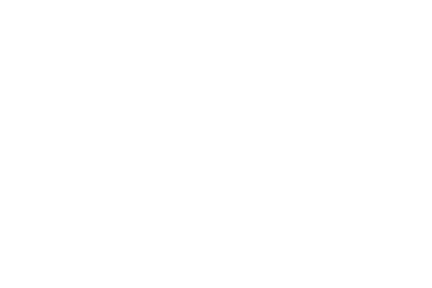

<IPython.core.display.Javascript object>


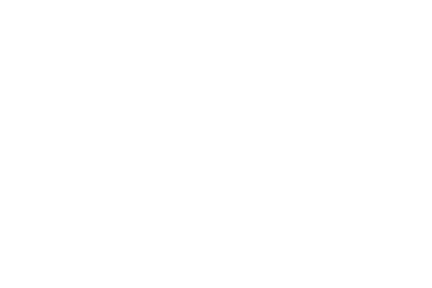

In [11]:
# If you want to see your morph as an animation, run this cell. 
# Close the output (press the blue "Stop interaction" button) once you are done!

# Due to some matplotlib problem you may have to restart your kernel!
%matplotlib notebook
import matplotlib.animation as animation
fig = plt.figure()

ims = []
for i, ratio in enumerate(np.linspace(0, 1, 24), 1):
    plt.axis('off')
    im = plt.imshow(my_morph(img1, img2, ratio), cmap='gray', animated=True)
    ims.append([im])  
    
ani = animation.ArtistAnimation(fig, ims + list(reversed(ims)), interval=100, blit=True)

plt.show()

## Assignment 3: Implementation: Skeletonization [5 Points]

### a) Skeletonization with hit-or-miss

Explain in your own words, how the hit-or-miss operator can be used for skeletonization (cf CV-05 slide 49).  

We define an structuring element in a picture that we are looking for. Then we are going with this structuring element through the whole picture and apply erosion on the picture. Afterwards we invert the picture and go through it again with the inverted structuring element. Everywhere the two patterns are hitting the same pixel in the new matrix the searched object can be found witch its anchor point on the pixel. 

In the lecture slides: Does the anchor point does not count in for the second step on the inverted image?

### b) Implementation of skeletonization

Now use this method to implement your own skeletonization function. It is ok to use
`scipy.ndimage.morphology.binary_hit_or_miss` here (but of course *not* `skimage.morphology.skeletonize` or similar functions). Compare your result with (CV-05 slide 50). Note that computing the skeleton using this method may take some time ...

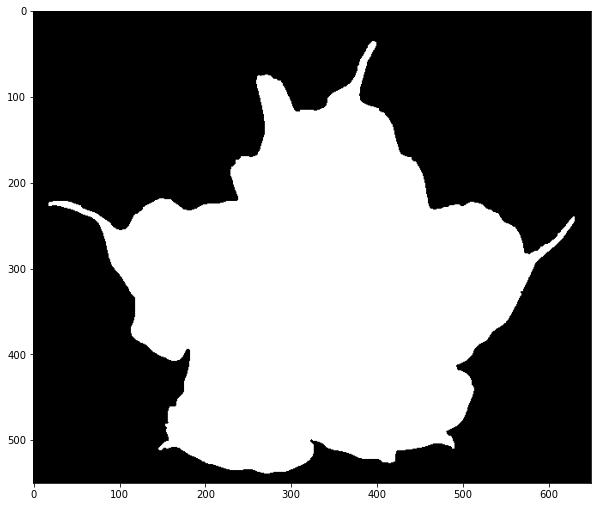

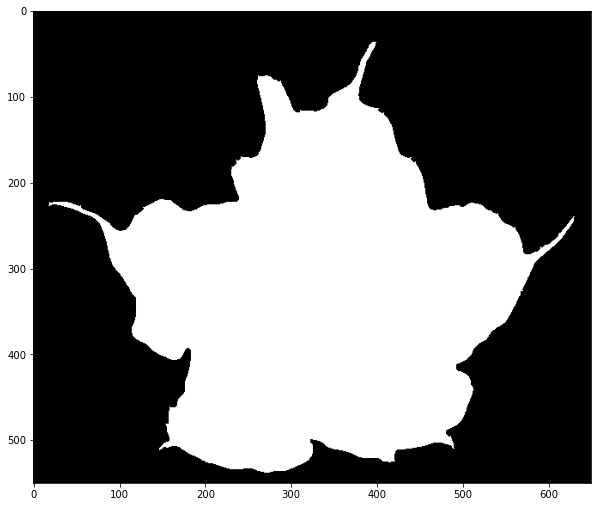

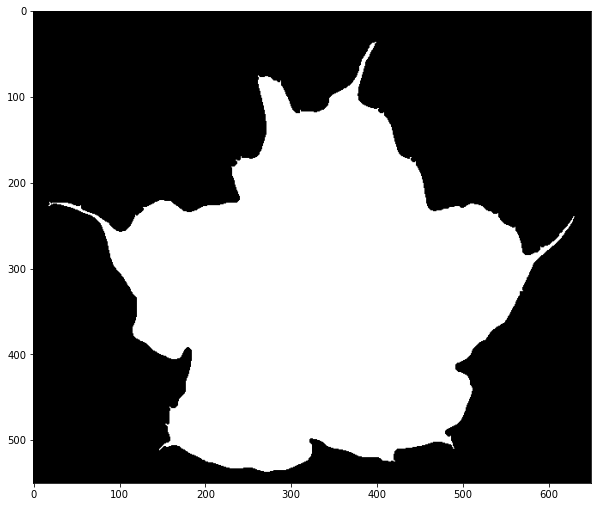

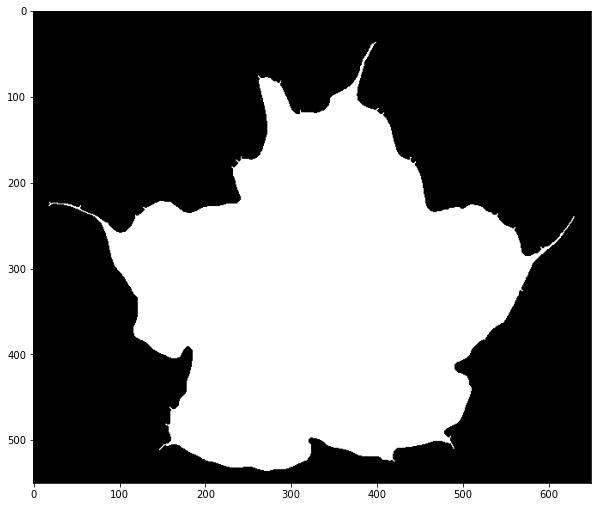

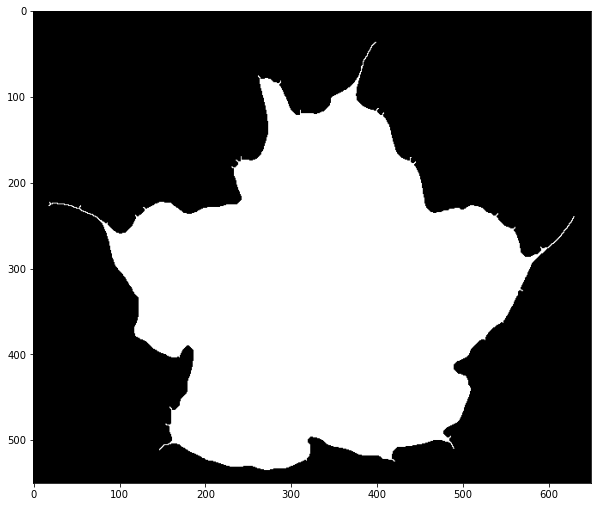

...

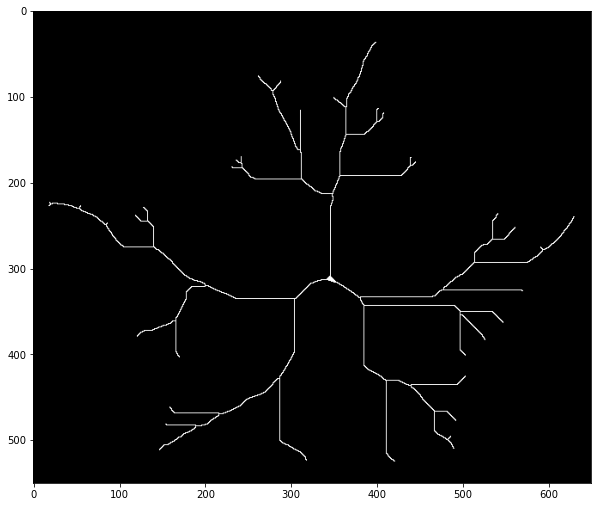

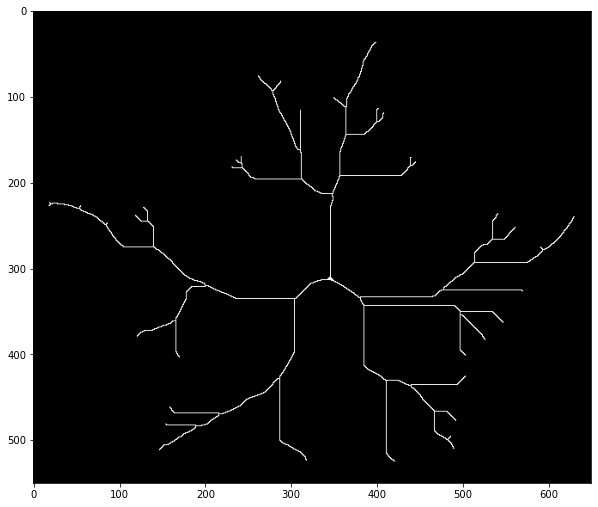

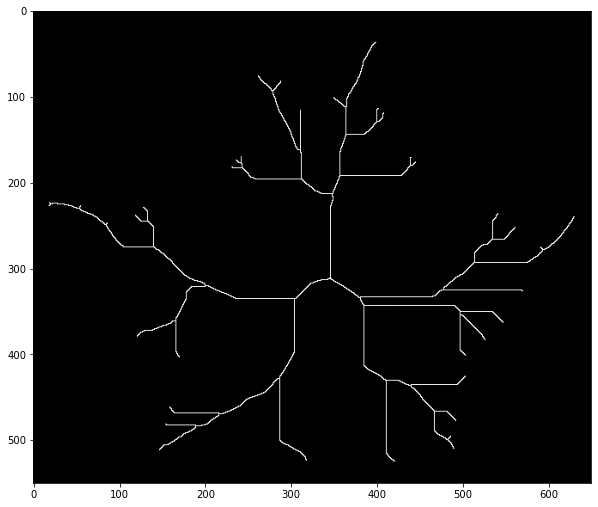

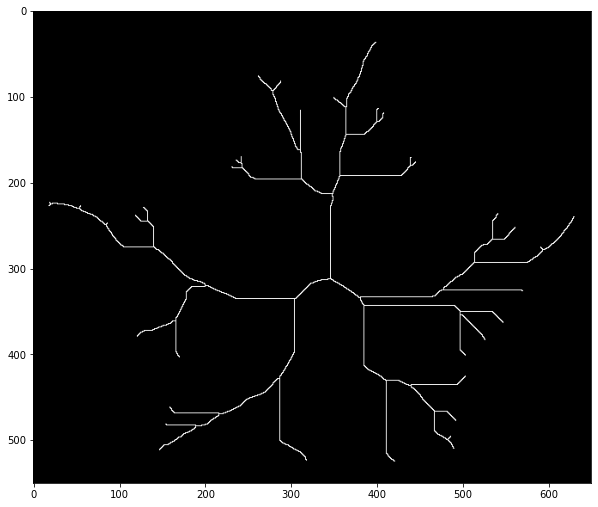

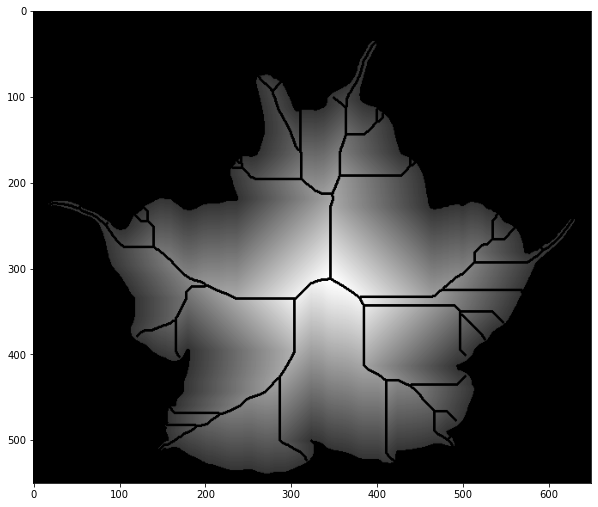

In [14]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import scipy.ndimage.morphology as morph
from imageio import imread

def my_skeletonize(img):
    """
    Compute the skeloton of a binary image using hit_or_miss operator.
    
    Parameters
    ----------
    img : ndarray of bools
        Binary image to be skeletonized.
    
    Returns
    -------
    skeleton : ndarray of bools
        The skeleton of the input image.
    """
    # BEGIN SOLUTION
    skeleton = np.zeros(img.shape,np.bool)
    
    left_hit = np.asarray([[0,0,1],
                           [0,1,1],
                           [0,0,1]],
                          np.bool)
    
    left_miss = np.asarray([[1,0,0],
                            [1,0,0],
                            [1,0,0]],
                           np.bool)

    right_hit = np.asarray([[1,0,0],
                            [1,1,0],
                            [1,0,0]], 
                            np.bool)
    
    right_miss = np.asarray([[0,0,1],
                            [0,0,1],
                            [0,0,1]], 
                            np.bool)

    top_hit = np.asarray([[0,0,0],
                         [0,1,0],
                         [1,1,1]], 
                        np.bool)
    
    top_miss = np.asarray([[1,1,1],
                          [0,0,0],
                          [0,0,0]], 
                         np.bool)

    bottom_hit = np.asarray([[1,1,1],
                             [0,1,0],
                             [0,0,0]], 
                            np.bool)
    
    bottom_miss = np.asarray([[0,0,0],
                              [0,0,0],
                              [1,1,1]], 
                             np.bool)

    left_top_hit = np.asarray([[0,1,1],
                              [0,1,1],
                              [0,0,0]],
                             np.bool)
    
    left_top_miss = np.asarray([[0,0,0],
                               [1,0,0],
                               [1,1,0]], 
                              np.bool)
    
    right_top_hit = np.asarray([[1,1,0],
                              [1,1,0],
                              [0,0,0]],
                             np.bool)
    
    right_top_miss = np.asarray([[0,0,0],
                               [0,0,1],
                               [0,1,1]],
                              np.bool)
    
    left_bottom_hit = np.asarray([[0,0,0],
                                  [0,1,1],
                                  [0,1,1]], 
                                 np.bool)
    
    left_bottom_miss = np.asarray([[1,1,0],
                                   [1,0,0],
                                   [0,0,0]],
                                  np.bool)

    right_bottom_hit = np.asarray([[0,0,0],
                                   [1,1,0],
                                   [1,1,0]],
                                  np.bool)
    
    right_bottom_miss = np.asarray([[0,1,1],
                                    [0,0,1],
                                    [0,0,0]],
                                   np.bool)



    while (skeleton != img).any():
        skeleton = img
        
        img = img ^ morph.binary_hit_or_miss(img, left_hit, left_miss)
        
        img = img ^ morph.binary_hit_or_miss(img, right_hit, right_miss)
        
        img = img ^ morph.binary_hit_or_miss(img, top_hit, top_miss)
        
        img = img ^ morph.binary_hit_or_miss(img, bottom_hit, bottom_miss)

        img = img ^ morph.binary_hit_or_miss(img, left_top_hit, left_top_miss)
        
        img = img ^ morph.binary_hit_or_miss(img, right_top_hit, right_top_miss)
        
        img = img ^ morph.binary_hit_or_miss(img, left_bottom_hit, left_bottom_miss)

        img = img ^ morph.binary_hit_or_miss(img, right_bottom_hit, right_bottom_miss)
        
        plt.figure(figsize=(10,10))
        plt.gray()
        plt.imshow(skeleton)
        plt.show()
    
    return skeleton
    # END SOLUTION


img = imread("images/engelstrompete.png") > 0
skel = my_skeletonize(img)
result = morph.distance_transform_cdt(img, metric='taxicab') + (50 * img)
result[morph.binary_dilation(skel)] = 0
plt.figure(figsize=(10,10))
plt.gray()
plt.imshow(result)
plt.show()

## Assignment 4: Custom Structuring Element [5 points]

Landsat 7 is a satelite mission for acquisition of satellite imagery of Earth. Unfortunately the Scan Line Corrector failed, resulting in black stripes on the aquired images. More information: https://landsat.usgs.gov/slc-products-background


### a) A first fix

A rather crude fix is to apply a custom structuring element for dilation and erosion (see CV-05, 24ff). Complement the code below (in part (b)) in the following way:
* Rotate the image such that the gaps are horizontal.
* Dilate the rotated image with a vertical structuring element. I.e. take the maximum of an area of size $7 \times1$ and assign it to the center pixel. Repeat for all pixels.
* Erode the dilated image.
* Rotate the result back.

Remark: this exercise applies morphological operator to color images. This extends the idea of generalizing morphological operators to gray value images (CV-05, slide 51).  

### b) Improving the solution
You may get better results by thresholding and applying the morphological operations only to pixels below a threshold, i.e. gap pixels. Compliment your solution from a). 

NameError: name 'thresh_img' is not defined

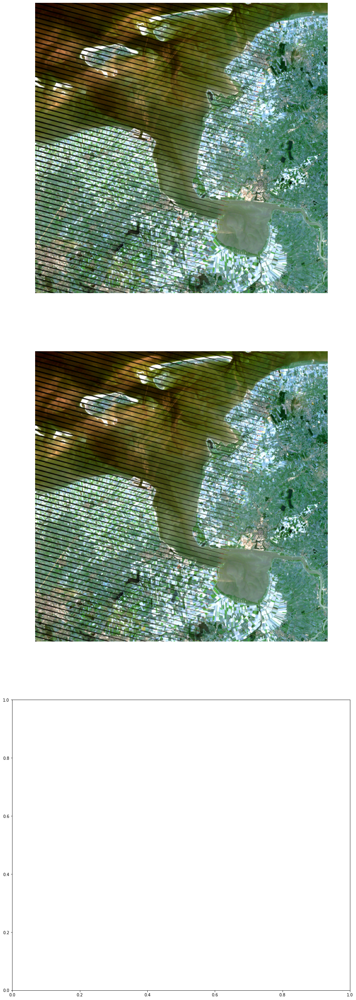

In [15]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import scipy.ndimage.morphology as morph
import scipy.ndimage as ndimg
from skimage import color
from skimage.transform import rescale as rescale
from imageio import imread


angle = 15
thresh = .3
struc_elem = np.ones((5,1), dtype=np.bool)

img = imread("images/landsat_stack2.png")
img2 = img.copy()
img3 = img.copy()

# YOUR CODE HERE
img = (img - np.min(img))/np.ptp(img)
img3 = (img3 - np.min(img3))/np.ptp(img3)


plt.figure(figsize=(15,45))
plt.subplot(3,1,1); plt.imshow(img); plt.axis('off')
plt.subplot(3,1,2); plt.imshow(img3); plt.axis('off')
plt.subplot(3,1,3); plt.imshow(thresh_img); plt.axis('off')
plt.imshow(thresh_img)
plt.show()


### c) Bonus
Can you think of other ways to add the missing data? 


YOUR ANSWER HERE